In [1]:
import pandas as pd
import numpy as np
import folium
import json

df = pd.read_csv("../data/listings(Sept).csv")

In [2]:
neigbourhoods = df['neighbourhood'].unique()
print(neigbourhoods)

['Indre By' 'Vesterbro-Kongens Enghave' 'Frederiksberg' 'sterbro'
 'Nrrebro' 'Amager Vest' 'Amager st' 'Valby' 'Vanlse' 'Bispebjerg'
 'Brnshj-Husum']


In [3]:
map = folium.Map([55.6761,12.5683],zoom_start=11)
with open('../data/neighbourhoods.geojson') as f:
    geojson_data = json.load(f)
folium.GeoJson(geojson_data).add_to(map)

latitudes = df['latitude'].to_numpy()
longitudes = df['longitude'].to_numpy()

print(latitudes.shape)

for i in range(0,latitudes.size):
    folium.Circle(location=[latitudes[i],longitudes[i]]).add_to(map)

map

(18126,)


Nrrebro                      17.626614
Vesterbro-Kongens Enghave    17.394902
Indre By                     14.515061
Frederiksberg                10.592519
sterbro                      10.421494
Amager Vest                   9.036743
Amager st                     7.403729
Bispebjerg                    4.512854
Valby                         4.165287
Vanlse                        2.361249
Brnshj-Husum                  1.969547
Name: neighbourhood, dtype: float64


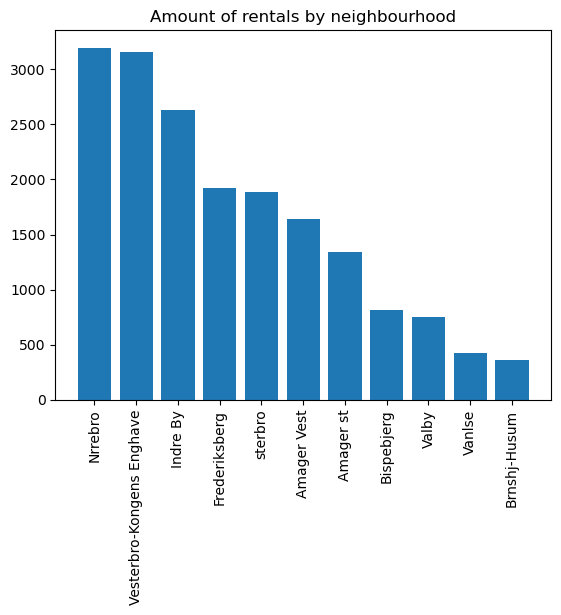

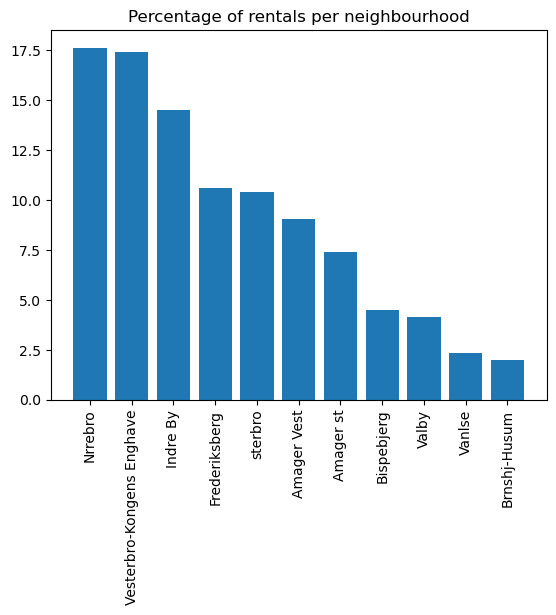

In [4]:
neigbourhoods_data = df['neighbourhood']
neigbourhoods_counts = neigbourhoods_data.value_counts()
neigbourhoods_counts_normalized = (neigbourhoods_counts/neigbourhoods_counts.sum())*100
print(neigbourhoods_counts_normalized)
import matplotlib.pyplot as plt
plt.figure()
plt.bar(neigbourhoods_counts.index, neigbourhoods_counts)
plt.xticks(rotation='vertical')
plt.title("Amount of rentals by neighbourhood")
plt.show()

plt.figure()
plt.bar(neigbourhoods_counts_normalized.index, neigbourhoods_counts_normalized)
plt.xticks(rotation='vertical')
plt.title("Percentage of rentals per neighbourhood")
plt.show()


In [5]:
from folium import plugins
map = folium.Map([55.6761,12.5683],zoom_start=11)
heat_data = [[latitudes[i], longitudes[i]] for i in range(len(latitudes))]

heat_data
plugins.HeatMap(heat_data, radius=10, gradient={0.5: 'blue', 0.2: 'green', 1: 'red'}, blur=15).add_to(map)
map

In [14]:
from folium import plugins
import plotly.express as px
second_map = folium.Map([55.6761,12.5683],zoom_start=11, tiles="cartodb positron",tooltip = 'This tooltip will appear on hover')

first_map = folium.Map([55.6761,12.5683],zoom_start=11)

with open('../data/neighbourhoods.geojson') as f:
    geojson_data = json.load(f)
# folium.GeoJson(geojson_data,name="Neighborhood borders").add_to(first_map)
folium.GeoJson(geojson_data,name="Neighborhood borders").add_to(second_map)

ngbh_count = df.groupby(['neighbourhood']).size().reset_index(name='Count')

latitudes = df['latitude'].to_numpy()
longitudes = df['longitude'].to_numpy()
neigbourhoods = df['neighbourhood'].unique()

neighborhood_groups = {}
for ngbh in neigbourhoods:
    neighborhood_groups[ngbh] = folium.FeatureGroup(name=ngbh, show=False)
    
for i in range(0,latitudes.size):
    folium.CircleMarker(location=[latitudes[i],longitudes[i]], popup="<a href=https://airbnb.com>AirBnB</a>", radius=3).add_to(neighborhood_groups[neigbourhoods_data[i]])
    
for neighborhood_group in neighborhood_groups.values():
    # neighborhood_group.
    neighborhood_group.add_to(first_map)

folium.Choropleth(
    geo_data=geojson_data,
    data=ngbh_count,
    columns=["neighbourhood", "Count"],
    key_on="feature.properties.neighbourhood",
    fill_color="RdYlGn_r",
    fill_opacity=0.8,
    line_opacity=0.3,
    nan_fill_color="white",
    legend_name="AirBnBs per neighborhood",
    name="AirBnBs per neighborhood"
).add_to(second_map)


style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
NIL = folium.features.GeoJson(
    geojson_data,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['neighbourhood'],
        aliases=['Neighborhood: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
second_map.add_child(NIL)
second_map.keep_in_front(NIL)

folium.LayerControl(collapsed=False).add_to(first_map)


# first_map

first_map.save('../data_htmls/airbnbs_marker.html')
second_map.save('../data_htmls/choropleth_map.html')

# second_map

In [15]:
landmarks_df = pd.read_csv("../data/landmarks.csv")
for i in range(0,landmarks_df['Landmark'].size):
    folium.Marker(location=[landmarks_df['latitude'][i],landmarks_df['longitude'][i]], popup=landmarks_df['Landmark'][i]).add_to(second_map)

# second_map
second_map.save('../data_htmls/choropleth_map_landmarks.html')
